In [87]:
#https://betterprogramming.pub/analyze-your-icloud-health-data-with-pandas-dd5e963e902f
import pandas as pd
import xmltodict
import re

#xmltodict will convert the input file to a Python dictionary.
input_path = './na_applehealth_20220624.xml'
with open(input_path, 'r') as xml_file:
    input_data = xmltodict.parse(xml_file.read())

In [88]:
#Variable input_data is a dictionary containing the whole data from the original XML file.
#Actual health records are stored in the Record key of the HealthData dictionary:
records_list = input_data['HealthData']['Record']

In [89]:
#This is a list of dictionaries that can be imported directly into a Pandas data frame:
df = pd.DataFrame(records_list)

In [90]:
#Data Structure Inspection
#You can visualize all fields of the imported record list by running:
df.columns

Index(['@type', '@sourceName', '@sourceVersion', '@unit', '@creationDate',
       '@startDate', '@endDate', '@value', 'MetadataEntry', '@device',
       'HeartRateVariabilityMetadataList'],
      dtype='object')

In [91]:
#Note: all field names start with an @ symbol.
#For simplicity, I will refer to them simply by their name without this prefix character.
#To show all distinct values of a field, execute the following code:
df['@type'].unique()

array(['HKQuantityTypeIdentifierBodyMassIndex',
       'HKQuantityTypeIdentifierHeight',
       'HKQuantityTypeIdentifierBodyMass',
       'HKQuantityTypeIdentifierHeartRate',
       'HKQuantityTypeIdentifierOxygenSaturation',
       'HKQuantityTypeIdentifierBloodPressureSystolic',
       'HKQuantityTypeIdentifierBloodPressureDiastolic',
       'HKQuantityTypeIdentifierRespiratoryRate',
       'HKQuantityTypeIdentifierBodyFatPercentage',
       'HKQuantityTypeIdentifierLeanBodyMass',
       'HKQuantityTypeIdentifierStepCount',
       'HKQuantityTypeIdentifierDistanceWalkingRunning',
       'HKQuantityTypeIdentifierBasalEnergyBurned',
       'HKQuantityTypeIdentifierActiveEnergyBurned',
       'HKQuantityTypeIdentifierFlightsClimbed',
       'HKQuantityTypeIdentifierAppleExerciseTime',
       'HKQuantityTypeIdentifierDistanceCycling',
       'HKQuantityTypeIdentifierWaistCircumference',
       'HKQuantityTypeIdentifierRestingHeartRate',
       'HKQuantityTypeIdentifierVO2Max',
       'H

In [92]:
df

,@type,@sourceName,@sourceVersion,@unit,@creationDate,@startDate,@endDate,@value,MetadataEntry,@device,HeartRateVariabilityMetadataList
0,HKQuantityTypeIdentifierBodyMassIndex,FITINDEX,2,count,2020-09-15 18:18:28 -0700,2020-09-15 18:18:27 -0700,2020-09-15 18:18:27 -0700,27.4,NaN,NaN,NaN
1,HKQuantityTypeIdentifierBodyMassIndex,FITINDEX,2,count,2020-09-15 18:18:49 -0700,2020-09-15 18:18:48 -0700,2020-09-15 18:18:48 -0700,27.4,NaN,NaN,NaN
2,HKQuantityTypeIdentifierBodyMassIndex,FITINDEX,2,count,2020-09-15 18:20:08 -0700,2020-09-15 18:20:07 -0700,2020-09-15 18:20:07 -0700,27.5,NaN,NaN,NaN
3,HKQuantityTypeIdentifierBodyMassIndex,FITINDEX,2,count,2020-09-16 08:58:38 -0700,2020-09-16 08:58:37 -0700,2020-09-16 08:58:37 -0700,27.1,NaN,NaN,NaN
4,HKQuantityTypeIdentifierBodyMassIndex,FITINDEX,2,count,2020-09-16 09:41:57 -0700,2020-09-16 09:41:57 -0700,2020-09-16 09:41:57 -0700,27.1,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
1506956,HKQuantityTypeIdentifierHeartRateVariabilitySDNN,Neil’s Apple Watch,8.6,ms,2022-06-24 07:22:20 -0700,2022-06-24 07:21:14 -0700,2022-06-24 07:22:14 -0700,76.8228,"{'@key': 'HKAlgorithmVersion', '@value': '2'}","<<HKDevice: 0x2808388c0>, name:Apple Watch, ma...",{'InstantaneousBeatsPerMinute': [{'@bpm': '62'...
1506957,HKQuantityTypeIdentifierHeartRateVariabilitySDNN,Neil’s Apple Watch,8.6,ms,2022-06-24 12:48:26 -0700,2022-06-24 12:47:10 -0700,2022-06-24 12:48:09 -0700,56.5412,"{'@key': 'HKAlgorithmVersion', '@value': '2'}","<<HKDevice: 0x2808388c0>, name:Apple Watch, ma...",{'InstantaneousBeatsPerMinute': [{'@bpm': '80'...
1506958,HKQuantityTypeIdentifierHeartRateVariabilitySDNN,Neil’s Apple Watch,8.6,ms,2022-06-24 13:00:34 -0700,2022-06-24 12:59:28 -0700,2022-06-24 13:00:28 -0700,33.2714,"{'@key': 'HKAlgorithmVersion', '@value': '2'}","<<HKDevice: 0x2808388c0>, name:Apple Watch, ma...",{'InstantaneousBeatsPerMinute': [{'@bpm': '87'...
1506959,HKQuantityTypeIdentifierHeartRateVariabilitySDNN,Neil’s Apple Watch,8.6,ms,2022-06-24 13:22:31 -0700,2022-06-24 13:21:25 -0700,2022-06-24 13:22:25 -0700,27.5657,"{'@key': 'HKAlgorithmVersion', '@value': '2'}","<<HKDevice: 0x2808388c0>, name:Apple Watch, ma...",{'InstantaneousBeatsPerMinute': [{'@bpm': '96'...


In [93]:
# shorter observation names
df['@type'] = df['@type'].str.replace('HKQuantityTypeIdentifier', '')
df['@type'] = df['@type'].str.replace('HKCategoryTypeIdentifier', '')
df['@type'] = df['@type'].str.replace('SDNN', '')
df
#record_data['type'] = record_data['type'].str.replace('HKCategoryTypeIdentifier', '')
#record_data.tail()

,@type,@sourceName,@sourceVersion,@unit,@creationDate,@startDate,@endDate,@value,MetadataEntry,@device,HeartRateVariabilityMetadataList
0,BodyMassIndex,FITINDEX,2,count,2020-09-15 18:18:28 -0700,2020-09-15 18:18:27 -0700,2020-09-15 18:18:27 -0700,27.4,NaN,NaN,NaN
1,BodyMassIndex,FITINDEX,2,count,2020-09-15 18:18:49 -0700,2020-09-15 18:18:48 -0700,2020-09-15 18:18:48 -0700,27.4,NaN,NaN,NaN
2,BodyMassIndex,FITINDEX,2,count,2020-09-15 18:20:08 -0700,2020-09-15 18:20:07 -0700,2020-09-15 18:20:07 -0700,27.5,NaN,NaN,NaN
3,BodyMassIndex,FITINDEX,2,count,2020-09-16 08:58:38 -0700,2020-09-16 08:58:37 -0700,2020-09-16 08:58:37 -0700,27.1,NaN,NaN,NaN
4,BodyMassIndex,FITINDEX,2,count,2020-09-16 09:41:57 -0700,2020-09-16 09:41:57 -0700,2020-09-16 09:41:57 -0700,27.1,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
1506956,HeartRateVariability,Neil’s Apple Watch,8.6,ms,2022-06-24 07:22:20 -0700,2022-06-24 07:21:14 -0700,2022-06-24 07:22:14 -0700,76.8228,"{'@key': 'HKAlgorithmVersion', '@value': '2'}","<<HKDevice: 0x2808388c0>, name:Apple Watch, ma...",{'InstantaneousBeatsPerMinute': [{'@bpm': '62'...
1506957,HeartRateVariability,Neil’s Apple Watch,8.6,ms,2022-06-24 12:48:26 -0700,2022-06-24 12:47:10 -0700,2022-06-24 12:48:09 -0700,56.5412,"{'@key': 'HKAlgorithmVersion', '@value': '2'}","<<HKDevice: 0x2808388c0>, name:Apple Watch, ma...",{'InstantaneousBeatsPerMinute': [{'@bpm': '80'...
1506958,HeartRateVariability,Neil’s Apple Watch,8.6,ms,2022-06-24 13:00:34 -0700,2022-06-24 12:59:28 -0700,2022-06-24 13:00:28 -0700,33.2714,"{'@key': 'HKAlgorithmVersion', '@value': '2'}","<<HKDevice: 0x2808388c0>, name:Apple Watch, ma...",{'InstantaneousBeatsPerMinute': [{'@bpm': '87'...
1506959,HeartRateVariability,Neil’s Apple Watch,8.6,ms,2022-06-24 13:22:31 -0700,2022-06-24 13:21:25 -0700,2022-06-24 13:22:25 -0700,27.5657,"{'@key': 'HKAlgorithmVersion', '@value': '2'}","<<HKDevice: 0x2808388c0>, name:Apple Watch, ma...",{'InstantaneousBeatsPerMinute': [{'@bpm': '96'...


In [126]:
#df.to_csv('na_applehealth_all_20220624.csv', mode='w', index=False)

In [94]:
#pandas dataframe find and show rows containing a word
#the double df[df...] leads to printing of column headers instead of just rows
#change column name to whichever desired.
#df[df['@sourceName'].str.contains('Virgin Pulse')] #find from specific column
df[df.apply(lambda row: row.astype(str).str.contains('Fat').any(), axis=1)] #find matching word in any row/column. more resource intensive.

,@type,@sourceName,@sourceVersion,@unit,@creationDate,@startDate,@endDate,@value,MetadataEntry,@device,HeartRateVariabilityMetadataList
261869,BodyFatPercentage,FITINDEX,2,%,2020-09-15 18:18:28 -0700,2020-09-15 18:18:27 -0700,2020-09-15 18:18:27 -0700,0.236,NaN,NaN,NaN
261870,BodyFatPercentage,FITINDEX,2,%,2020-09-15 18:18:49 -0700,2020-09-15 18:18:48 -0700,2020-09-15 18:18:48 -0700,0.237,NaN,NaN,NaN
261871,BodyFatPercentage,FITINDEX,2,%,2020-09-15 18:20:08 -0700,2020-09-15 18:20:07 -0700,2020-09-15 18:20:07 -0700,0.231,NaN,NaN,NaN
261872,BodyFatPercentage,FITINDEX,2,%,2020-09-16 08:58:38 -0700,2020-09-16 08:58:37 -0700,2020-09-16 08:58:37 -0700,0.225,NaN,NaN,NaN
261873,BodyFatPercentage,FITINDEX,2,%,2020-09-16 09:41:57 -0700,2020-09-16 09:41:57 -0700,2020-09-16 09:41:57 -0700,0.225,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
261963,BodyFatPercentage,FITINDEX,1,%,2022-06-11 10:21:55 -0700,2022-05-29 03:30:34 -0700,2022-05-29 03:30:34 -0700,0.242,NaN,NaN,NaN
261964,BodyFatPercentage,FITINDEX,1,%,2022-06-11 10:21:55 -0700,2022-05-25 21:17:17 -0700,2022-05-25 21:17:17 -0700,0.243,NaN,NaN,NaN
261965,BodyFatPercentage,FITINDEX,1,%,2022-06-15 13:58:07 -0700,2022-06-13 13:36:05 -0700,2022-06-13 13:36:05 -0700,0.236,NaN,NaN,NaN
261966,BodyFatPercentage,FITINDEX,1,%,2022-06-15 13:58:25 -0700,2022-06-15 13:58:18 -0700,2022-06-15 13:58:18 -0700,0.217,NaN,NaN,NaN


In [95]:
df['@sourceName'].unique()

array(['FITINDEX', 'Health', 'Neil’s Apple\xa0Watch', 'iHealth',
       'Blood Oxygen', 'iPhonePAC2007', 'Virgin Pulse', 'Sleep'],
      dtype=object)

In [96]:
fat = df[df.apply(lambda row: row.astype(str).str.contains('Fat').any(), axis=1)] #find matching word in any row/column. more resource intensive.

In [97]:
#delete unnecessary/ irrelevant columns
fat.drop(['@sourceName', '@sourceVersion', '@unit', '@startDate', '@endDate', 'MetadataEntry', '@device', 'HeartRateVariabilityMetadataList'], axis=1, inplace=True)

/var/folders/cn/ypkb635x25vfp3vpl9w97x7m0000gn/T/ipykernel_66616/3600001172.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fat.drop(['@sourceName', '@sourceVersion', '@unit', '@startDate', '@endDate', 'MetadataEntry', '@device', 'HeartRateVariabilityMetadataList'], axis=1, inplace=True)


In [98]:
fat

,@type,@creationDate,@value
261869,BodyFatPercentage,2020-09-15 18:18:28 -0700,0.236
261870,BodyFatPercentage,2020-09-15 18:18:49 -0700,0.237
261871,BodyFatPercentage,2020-09-15 18:20:08 -0700,0.231
261872,BodyFatPercentage,2020-09-16 08:58:38 -0700,0.225
261873,BodyFatPercentage,2020-09-16 09:41:57 -0700,0.225
...,...,...,...
261963,BodyFatPercentage,2022-06-11 10:21:55 -0700,0.242
261964,BodyFatPercentage,2022-06-11 10:21:55 -0700,0.243
261965,BodyFatPercentage,2022-06-15 13:58:07 -0700,0.236
261966,BodyFatPercentage,2022-06-15 13:58:25 -0700,0.217


In [99]:
#reset index
fat.reset_index(drop=True)
#to permanently reset index, include the inplace=True argument, eg.
#fat.reset_index(drop=True, inplace=True)

,@type,@creationDate,@value
0,BodyFatPercentage,2020-09-15 18:18:28 -0700,0.236
1,BodyFatPercentage,2020-09-15 18:18:49 -0700,0.237
2,BodyFatPercentage,2020-09-15 18:20:08 -0700,0.231
3,BodyFatPercentage,2020-09-16 08:58:38 -0700,0.225
4,BodyFatPercentage,2020-09-16 09:41:57 -0700,0.225
...,...,...,...
94,BodyFatPercentage,2022-06-11 10:21:55 -0700,0.242
95,BodyFatPercentage,2022-06-11 10:21:55 -0700,0.243
96,BodyFatPercentage,2022-06-15 13:58:07 -0700,0.236
97,BodyFatPercentage,2022-06-15 13:58:25 -0700,0.217


In [100]:
import matplotlib.pyplot as plt

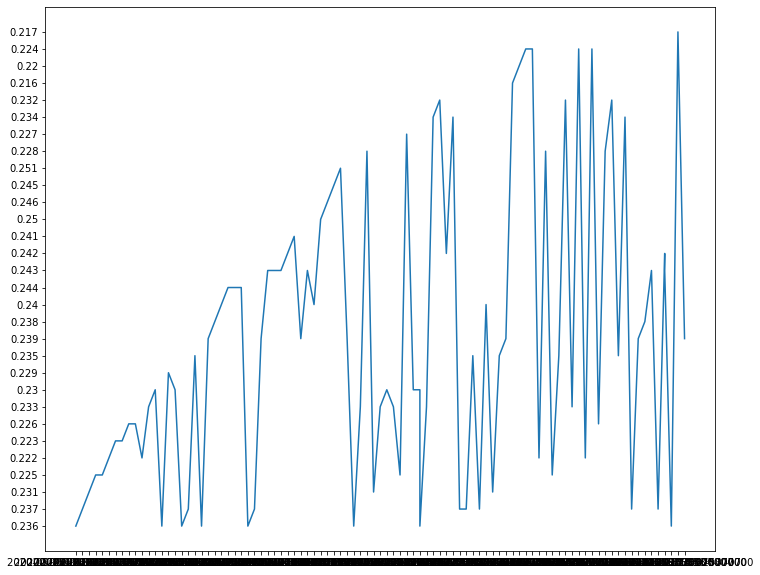

In [101]:
#matplotlib subplot option
plt.figure(figsize=(12,10))
plt.plot(fat['@creationDate'], fat['@value'])
#plt.xticks(fat['@creationDate'], rotation=90)

In [102]:
fat['@value'] = fat['@value'].apply(pd.to_numeric)

/var/folders/cn/ypkb635x25vfp3vpl9w97x7m0000gn/T/ipykernel_66616/437530897.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fat['@value'] = fat['@value'].apply(pd.to_numeric)


In [103]:
fat['@value'] = fat['@value'].apply(lambda x: x*100)

/var/folders/cn/ypkb635x25vfp3vpl9w97x7m0000gn/T/ipykernel_66616/1401738941.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fat['@value'] = fat['@value'].apply(lambda x: x*100)


In [104]:
fat

,@type,@creationDate,@value
261869,BodyFatPercentage,2020-09-15 18:18:28 -0700,23.6
261870,BodyFatPercentage,2020-09-15 18:18:49 -0700,23.7
261871,BodyFatPercentage,2020-09-15 18:20:08 -0700,23.1
261872,BodyFatPercentage,2020-09-16 08:58:38 -0700,22.5
261873,BodyFatPercentage,2020-09-16 09:41:57 -0700,22.5
...,...,...,...
261963,BodyFatPercentage,2022-06-11 10:21:55 -0700,24.2
261964,BodyFatPercentage,2022-06-11 10:21:55 -0700,24.3
261965,BodyFatPercentage,2022-06-15 13:58:07 -0700,23.6
261966,BodyFatPercentage,2022-06-15 13:58:25 -0700,21.7


In [105]:
fat.drop(columns=['@type'], inplace=True)
fat.reset_index(drop=True, inplace=True)
fat

/var/folders/cn/ypkb635x25vfp3vpl9w97x7m0000gn/T/ipykernel_66616/2732957829.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fat.drop(columns=['@type'], inplace=True)


,@creationDate,@value
0,2020-09-15 18:18:28 -0700,23.6
1,2020-09-15 18:18:49 -0700,23.7
2,2020-09-15 18:20:08 -0700,23.1
3,2020-09-16 08:58:38 -0700,22.5
4,2020-09-16 09:41:57 -0700,22.5
...,...,...
94,2022-06-11 10:21:55 -0700,24.2
95,2022-06-11 10:21:55 -0700,24.3
96,2022-06-15 13:58:07 -0700,23.6
97,2022-06-15 13:58:25 -0700,21.7


In [108]:
fat.columns=['Date', 'Fat%']
fat

,Date,Fat%
0,2020-09-15 18:18:28 -0700,23.6
1,2020-09-15 18:18:49 -0700,23.7
2,2020-09-15 18:20:08 -0700,23.1
3,2020-09-16 08:58:38 -0700,22.5
4,2020-09-16 09:41:57 -0700,22.5
...,...,...
94,2022-06-11 10:21:55 -0700,24.2
95,2022-06-11 10:21:55 -0700,24.3
96,2022-06-15 13:58:07 -0700,23.6
97,2022-06-15 13:58:25 -0700,21.7


In [109]:
fatBAK1=fat

In [110]:
fat = fat.set_index('Date') #set index to Date column
fat

,Fat%
Date,
2020-09-15 18:18:28 -0700,23.6
2020-09-15 18:18:49 -0700,23.7
2020-09-15 18:20:08 -0700,23.1
2020-09-16 08:58:38 -0700,22.5
2020-09-16 09:41:57 -0700,22.5
...,...
2022-06-11 10:21:55 -0700,24.2
2022-06-11 10:21:55 -0700,24.3
2022-06-15 13:58:07 -0700,23.6


In [111]:
fatBAK2 = fat
fatBAK2

,Fat%
Date,
2020-09-15 18:18:28 -0700,23.6
2020-09-15 18:18:49 -0700,23.7
2020-09-15 18:20:08 -0700,23.1
2020-09-16 08:58:38 -0700,22.5
2020-09-16 09:41:57 -0700,22.5
...,...
2022-06-11 10:21:55 -0700,24.2
2022-06-11 10:21:55 -0700,24.3
2022-06-15 13:58:07 -0700,23.6


In [112]:
#fat=fatBAK2 #if testing something new, otherwise comment out.
fat['SimpleMovingAverage_30_days'] = fat['Fat%'].rolling(30).mean()
fat.dropna(inplace=True)
fat

,Fat%,SimpleMovingAverage_30_days
Date,,
2020-12-25 11:33:13 -0700,24.3,23.340000
2020-12-25 11:33:36 -0700,24.3,23.363333
2020-12-29 01:19:13 -0700,24.3,23.383333
2021-01-06 19:08:31 -0700,24.2,23.420000
2021-01-06 19:09:20 -0700,24.1,23.473333
...,...,...
2022-06-11 10:21:55 -0700,24.2,23.130000
2022-06-11 10:21:55 -0700,24.3,23.170000
2022-06-15 13:58:07 -0700,23.6,23.173333


(array([-10.,   0.,  10.,  20.,  30.,  40.,  50.,  60.,  70.,  80.]),
 [Text(-10.0, 0, '2022-05-22 10:31:25 -0700'),
  Text(0.0, 0, '2020-12-25 11:33:13 -0700'),
  Text(10.0, 0, '2021-04-10 20:54:12 -0700'),
  Text(20.0, 0, '2021-07-11 15:05:36 -0700'),
  Text(30.0, 0, '2021-10-02 23:07:26 -0700'),
  Text(40.0, 0, '2021-12-25 06:52:23 -0700'),
  Text(50.0, 0, '2022-03-09 08:53:20 -0700'),
  Text(60.0, 0, '2022-05-22 10:31:25 -0700'),
  Text(70.0, 0, ''),
  Text(80.0, 0, '')])

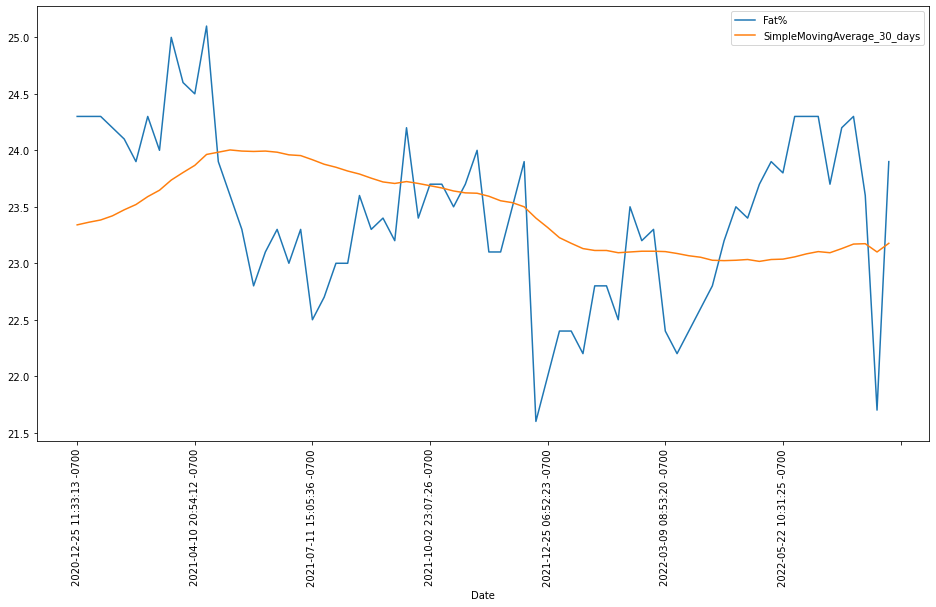

In [113]:
#reliance[['Close', 'SMA30']].plot(label='RELIANCE', figsize=(16, 8))
fat[['Fat%', 'SimpleMovingAverage_30_days']].plot(label='Total Body Fat %', figsize=(16,8))
plt.xticks(rotation=90)

In [114]:
fatBAK2

,Fat%,SimpleMovingAverage_30_days
Date,,
2020-12-25 11:33:13 -0700,24.3,23.340000
2020-12-25 11:33:36 -0700,24.3,23.363333
2020-12-29 01:19:13 -0700,24.3,23.383333
2021-01-06 19:08:31 -0700,24.2,23.420000
2021-01-06 19:09:20 -0700,24.1,23.473333
...,...,...
2022-06-11 10:21:55 -0700,24.2,23.130000
2022-06-11 10:21:55 -0700,24.3,23.170000
2022-06-15 13:58:07 -0700,23.6,23.173333


In [117]:
fatBAK1.to_csv('fat_20220615_2.csv',mode='w', index=False)

In [116]:
fatBAK1

,Date,Fat%
0,2020-09-15 18:18:28 -0700,23.6
1,2020-09-15 18:18:49 -0700,23.7
2,2020-09-15 18:20:08 -0700,23.1
3,2020-09-16 08:58:38 -0700,22.5
4,2020-09-16 09:41:57 -0700,22.5
...,...,...
94,2022-06-11 10:21:55 -0700,24.2
95,2022-06-11 10:21:55 -0700,24.3
96,2022-06-15 13:58:07 -0700,23.6
97,2022-06-15 13:58:25 -0700,21.7


In [134]:
#find matching word in any row/column. more resource intensive.
steps = df[df.apply(lambda row: row.astype(str).str.contains('StepCount').any(), axis=1)]
steps

,@type,@sourceName,@sourceVersion,@unit,@creationDate,@startDate,@endDate,@value,MetadataEntry,@device,HeartRateVariabilityMetadataList
262067,StepCount,iPhonePAC2007,9.0.1,count,2016-01-30 17:13:32 -0700,2016-01-30 16:38:28 -0700,2016-01-30 16:43:44 -0700,60,NaN,"<<HKDevice: 0x28086b480>, name:iPhone, manufac...",NaN
262068,StepCount,iPhonePAC2007,9.0.1,count,2016-01-30 17:13:32 -0700,2016-01-30 16:43:44 -0700,2016-01-30 16:46:54 -0700,314,NaN,"<<HKDevice: 0x28086b480>, name:iPhone, manufac...",NaN
262069,StepCount,iPhonePAC2007,9.0.1,count,2016-01-30 17:13:32 -0700,2016-01-30 16:46:54 -0700,2016-01-30 16:52:43 -0700,8,NaN,"<<HKDevice: 0x28086b480>, name:iPhone, manufac...",NaN
262070,StepCount,iPhonePAC2007,9.0.1,count,2016-01-30 17:13:32 -0700,2016-01-30 16:52:43 -0700,2016-01-30 16:57:35 -0700,116,NaN,"<<HKDevice: 0x28086b480>, name:iPhone, manufac...",NaN
262071,StepCount,iPhonePAC2007,9.0.1,count,2016-01-30 17:13:32 -0700,2016-01-30 16:57:35 -0700,2016-01-30 17:02:19 -0700,136,NaN,"<<HKDevice: 0x28086b480>, name:iPhone, manufac...",NaN
...,...,...,...,...,...,...,...,...,...,...,...
418926,StepCount,Neil’s Apple Watch,8.6,count,2022-06-24 15:17:31 -0700,2022-06-24 15:14:40 -0700,2022-06-24 15:14:47 -0700,16,NaN,"<<HKDevice: 0x28086f2a0>, name:Apple Watch, ma...",NaN
418927,StepCount,Neil’s Apple Watch,8.6,count,2022-06-24 15:17:31 -0700,2022-06-24 15:16:50 -0700,2022-06-24 15:17:06 -0700,14,NaN,"<<HKDevice: 0x28086f2a0>, name:Apple Watch, ma...",NaN
418928,StepCount,Neil’s Apple Watch,8.6,count,2022-06-24 15:28:01 -0700,2022-06-24 15:22:18 -0700,2022-06-24 15:22:23 -0700,14,NaN,"<<HKDevice: 0x28086f2a0>, name:Apple Watch, ma...",NaN
418929,StepCount,Neil’s Apple Watch,8.6,count,2022-06-24 15:39:07 -0700,2022-06-24 15:35:27 -0700,2022-06-24 15:35:30 -0700,8,NaN,"<<HKDevice: 0x28086f2a0>, name:Apple Watch, ma...",NaN


In [135]:
stepsBAK1=steps

In [137]:
steps = steps.drop(columns=['@type', '@sourceName', '@sourceVersion', '@unit', '@startDate', '@endDate', 'MetadataEntry', '@device', 'HeartRateVariabilityMetadataList'])
steps

,@creationDate,@value
262067,2016-01-30 17:13:32 -0700,60
262068,2016-01-30 17:13:32 -0700,314
262069,2016-01-30 17:13:32 -0700,8
262070,2016-01-30 17:13:32 -0700,116
262071,2016-01-30 17:13:32 -0700,136
...,...,...
418926,2022-06-24 15:17:31 -0700,16
418927,2022-06-24 15:17:31 -0700,14
418928,2022-06-24 15:28:01 -0700,14
418929,2022-06-24 15:39:07 -0700,8


In [138]:
steps.reset_index(drop=True, inplace=True)
steps

,@creationDate,@value
0,2016-01-30 17:13:32 -0700,60
1,2016-01-30 17:13:32 -0700,314
2,2016-01-30 17:13:32 -0700,8
3,2016-01-30 17:13:32 -0700,116
4,2016-01-30 17:13:32 -0700,136
...,...,...
156859,2022-06-24 15:17:31 -0700,16
156860,2022-06-24 15:17:31 -0700,14
156861,2022-06-24 15:28:01 -0700,14
156862,2022-06-24 15:39:07 -0700,8


In [139]:
steps.columns=['CreationDate', 'StepCount']
steps

,CreationDate,StepCount
0,2016-01-30 17:13:32 -0700,60
1,2016-01-30 17:13:32 -0700,314
2,2016-01-30 17:13:32 -0700,8
3,2016-01-30 17:13:32 -0700,116
4,2016-01-30 17:13:32 -0700,136
...,...,...
156859,2022-06-24 15:17:31 -0700,16
156860,2022-06-24 15:17:31 -0700,14
156861,2022-06-24 15:28:01 -0700,14
156862,2022-06-24 15:39:07 -0700,8


In [140]:
stepsBAK2=steps

In [150]:
#format = '%Y-%m-%d %H:%M:%S %z'
#format = '%Y-%m-%d'
#convert datetime strings to actual datetime objects
#steps['CreationDate'] = pd.to_datetime(steps['CreationDate'], format=format)
steps['CreationDate'] = steps['CreationDate'].dt.date #keeps only date and not the time
steps

,CreationDate,StepCount
0,2016-01-30,60
1,2016-01-30,314
2,2016-01-30,8
3,2016-01-30,116
4,2016-01-30,136
...,...,...
156859,2022-06-24,16
156860,2022-06-24,14
156861,2022-06-24,14
156862,2022-06-24,8


In [142]:
#convert the value to the specific type for this metric:
steps.loc[:, 'StepCount'] = pd.to_numeric(steps.loc[:, 'StepCount'])
steps

,CreationDate,StepCount
0,2016-01-30 17:13:32-07:00,60
1,2016-01-30 17:13:32-07:00,314
2,2016-01-30 17:13:32-07:00,8
3,2016-01-30 17:13:32-07:00,116
4,2016-01-30 17:13:32-07:00,136
...,...,...
156859,2022-06-24 15:17:31-07:00,16
156860,2022-06-24 15:17:31-07:00,14
156861,2022-06-24 15:28:01-07:00,14
156862,2022-06-24 15:39:07-07:00,8


In [168]:
steps.dtypes

StepCount      int64
SMA30        float64
dtype: object

In [153]:
#step_counts.groupby('@creationDate').sum()
#group the steps by date and sum them all up
#syntax: DataFrame.groupby(by=None, axis=0, level=None, as_index=True, sort=True, group_keys=True)
steps = steps.groupby('CreationDate').sum()
steps

,StepCount
CreationDate,
2016-01-30,1412
2016-01-31,1458
2016-02-01,6241
2016-02-02,5703
2016-02-03,4407
...,...
2022-06-20,7448
2022-06-21,9982
2022-06-22,7486


In [155]:
steps['SMA30'] = steps['StepCount'].rolling(30).mean()
steps.dropna(inplace=True)
steps

,StepCount,SMA30
CreationDate,,
2016-02-28,1108,5240.533333
2016-02-29,5416,5374.000000
2016-03-01,7856,5587.266667
2016-03-02,5292,5555.633333
2016-03-03,5100,5535.533333
...,...,...
2022-06-20,7448,8727.133333
2022-06-21,9982,8967.266667
2022-06-22,7486,9015.333333


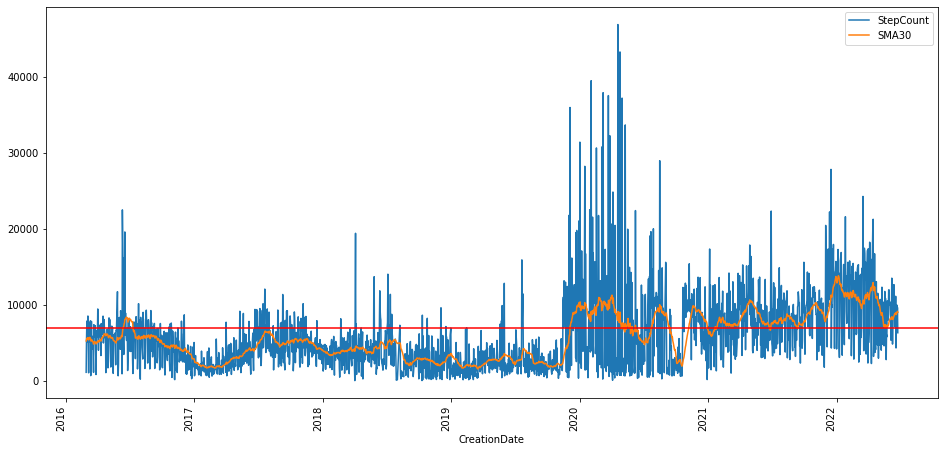

In [191]:
steps[['StepCount', 'SMA30']].plot(label='StepCount', figsize=(16,8))
plt.xticks(rotation=90)
plt.axhline(y = 7000, color = 'r', linestyle = '-')

In [173]:
steps.reset_index(drop=True)

,StepCount,SMA30
0,1108,5240.533333
1,5416,5374.000000
2,7856,5587.266667
3,5292,5555.633333
4,5100,5535.533333
...,...,...
2287,7448,8727.133333
2288,9982,8967.266667
2289,7486,9015.333333
2290,9646,9143.933333


In [175]:
steps.index = pd.to_datetime(steps.index)
steps
steps.dtypes

StepCount      int64
SMA30        float64
dtype: object

In [192]:
#display all rows
#To get counts by day, use the resample method with D as parameter:
steps['StepCount'].resample('D').sum()

CreationDate
2016-02-28    1108
2016-02-29    5416
2016-03-01    7856
2016-03-02    5292
2016-03-03    5100
              ... 
2022-06-20    7448
2022-06-21    9982
2022-06-22    7486
2022-06-23    9646
2022-06-24    6318
Freq: D, Name: StepCount, Length: 2309, dtype: int64

In [193]:
pd.set_option('display.max_rows', None)
#select rows between a range of dates
steps.loc['2019-12-31':'2021-01-01']

,StepCount,SMA30
CreationDate,,
2019-12-31,4214,10293.566667
2020-01-01,3659,9689.666667
2020-01-02,31412,10341.933333
2020-01-03,2383,10375.466667
2020-01-04,2237,9250.966667
2020-01-05,15344,9655.066667
2020-01-06,1627,9328.366667
2020-01-07,17090,9630.833333
2020-01-08,8777,9856.233333


In [196]:
#which rows have stepcounts more than a certain value
steps[steps.StepCount > 15000]

,StepCount,SMA30
CreationDate,,
2016-06-10,22493,6312.233333
2016-06-11,18222,6706.033333
2016-06-15,16192,7523.466667
2016-06-17,19588,8070.266667
2018-04-04,19411,4492.166667
2019-07-21,15911,3347.533333
2019-12-02,21776,5636.466667
2019-12-05,35972,7164.800000
2019-12-10,16158,8080.933333


In [198]:
#which rows have stepcounts more than a certain value. numpy way, quicker, more efficient.
steps.loc[steps['StepCount'] <= 25000]

,StepCount,SMA30
CreationDate,,
2016-02-28,1108,5240.533333
2016-02-29,5416,5374.000000
2016-03-01,7856,5587.266667
2016-03-02,5292,5555.633333
2016-03-03,5100,5535.533333
2016-03-04,8524,5672.766667
2016-03-05,4423,5552.100000
2016-03-06,1041,5367.033333
2016-03-07,7594,5497.633333


In [199]:
df[df.apply(lambda row: row.astype(str).str.contains('SleepAnalysis').any(), axis=1)]

,@type,@sourceName,@sourceVersion,@unit,@creationDate,@startDate,@endDate,@value,MetadataEntry,@device,HeartRateVariabilityMetadataList
1482100,SleepAnalysis,Neil’s Apple Watch,7.0.2,NaN,2020-10-21 07:39:34 -0700,2020-10-21 02:51:25 -0700,2020-10-21 04:05:55 -0700,HKCategoryValueSleepAnalysisAsleep,"{'@key': 'HKTimeZone', '@value': 'America/Los_...",NaN,NaN
1482101,SleepAnalysis,Neil’s Apple Watch,7.0.2,NaN,2020-10-21 07:39:34 -0700,2020-10-21 04:09:55 -0700,2020-10-21 04:35:55 -0700,HKCategoryValueSleepAnalysisAsleep,"{'@key': 'HKTimeZone', '@value': 'America/Los_...",NaN,NaN
1482102,SleepAnalysis,Neil’s Apple Watch,7.0.2,NaN,2020-10-21 07:39:34 -0700,2020-10-21 04:57:55 -0700,2020-10-21 05:29:25 -0700,HKCategoryValueSleepAnalysisAsleep,"{'@key': 'HKTimeZone', '@value': 'America/Los_...",NaN,NaN
1482103,SleepAnalysis,Neil’s Apple Watch,7.0.2,NaN,2020-10-21 07:39:34 -0700,2020-10-21 05:30:55 -0700,2020-10-21 06:24:55 -0700,HKCategoryValueSleepAnalysisAsleep,"{'@key': 'HKTimeZone', '@value': 'America/Los_...",NaN,NaN
1482104,SleepAnalysis,Neil’s Apple Watch,7.0.2,NaN,2020-10-21 07:39:34 -0700,2020-10-21 06:25:55 -0700,2020-10-21 07:32:55 -0700,HKCategoryValueSleepAnalysisAsleep,"{'@key': 'HKTimeZone', '@value': 'America/Los_...",NaN,NaN
1482105,SleepAnalysis,iPhonePAC2007,14.0,NaN,2020-10-21 07:39:34 -0700,2020-10-21 02:45:11 -0700,2020-10-21 07:36:31 -0700,HKCategoryValueSleepAnalysisInBed,"{'@key': 'HKTimeZone', '@value': 'America/Los_...",NaN,NaN
1482106,SleepAnalysis,iPhonePAC2007,14.0,NaN,2020-10-21 07:39:34 -0700,2020-10-21 07:37:28 -0700,2020-10-21 07:38:58 -0700,HKCategoryValueSleepAnalysisInBed,"{'@key': 'HKTimeZone', '@value': 'America/Los_...",NaN,NaN
1482107,SleepAnalysis,Neil’s Apple Watch,7.0.2,NaN,2020-10-22 07:40:15 -0700,2020-10-22 00:10:03 -0700,2020-10-22 01:18:33 -0700,HKCategoryValueSleepAnalysisAsleep,"{'@key': 'HKTimeZone', '@value': 'America/Los_...",NaN,NaN
1482108,SleepAnalysis,Neil’s Apple Watch,7.0.2,NaN,2020-10-22 07:40:15 -0700,2020-10-22 01:19:33 -0700,2020-10-22 02:58:33 -0700,HKCategoryValueSleepAnalysisAsleep,"{'@key': 'HKTimeZone', '@value': 'America/Los_...",NaN,NaN
1482109,SleepAnalysis,Neil’s Apple Watch,7.0.2,NaN,2020-10-22 07:40:15 -0700,2020-10-22 03:06:03 -0700,2020-10-22 03:22:33 -0700,HKCategoryValueSleepAnalysisAsleep,"{'@key': 'HKTimeZone', '@value': 'America/Los_...",NaN,NaN


In [200]:
df[df.apply(lambda row: row.astype(str).str.contains('SleepDuration').any(), axis=1)]

,@type,@sourceName,@sourceVersion,@unit,@creationDate,@startDate,@endDate,@value,MetadataEntry,@device,HeartRateVariabilityMetadataList
1482061,HKDataTypeSleepDurationGoal,Sleep,7.0.2,hr,2020-10-20 14:40:56 -0700,2020-10-20 14:40:56 -0700,2020-10-20 14:40:56 -0700,8,NaN,NaN,NaN
1482062,HKDataTypeSleepDurationGoal,Health,14.0,hr,2020-10-22 13:33:34 -0700,2020-10-22 13:33:34 -0700,2020-10-22 13:33:34 -0700,7,NaN,NaN,NaN


In [216]:
#sleep_data = data[data['type'] == "SleepAnalysis"]
#sleep_data = sleep_data[sleep_data['sourceName'] == "Jon’s Apple Watch"]

sleep = df[df['@type'] == "SleepAnalysis"]
sleep

,@type,@sourceName,@sourceVersion,@unit,@creationDate,@startDate,@endDate,@value,MetadataEntry,@device,HeartRateVariabilityMetadataList
1482100,SleepAnalysis,Neil’s Apple Watch,7.0.2,NaN,2020-10-21 07:39:34 -0700,2020-10-21 02:51:25 -0700,2020-10-21 04:05:55 -0700,HKCategoryValueSleepAnalysisAsleep,"{'@key': 'HKTimeZone', '@value': 'America/Los_...",NaN,NaN
1482101,SleepAnalysis,Neil’s Apple Watch,7.0.2,NaN,2020-10-21 07:39:34 -0700,2020-10-21 04:09:55 -0700,2020-10-21 04:35:55 -0700,HKCategoryValueSleepAnalysisAsleep,"{'@key': 'HKTimeZone', '@value': 'America/Los_...",NaN,NaN
1482102,SleepAnalysis,Neil’s Apple Watch,7.0.2,NaN,2020-10-21 07:39:34 -0700,2020-10-21 04:57:55 -0700,2020-10-21 05:29:25 -0700,HKCategoryValueSleepAnalysisAsleep,"{'@key': 'HKTimeZone', '@value': 'America/Los_...",NaN,NaN
1482103,SleepAnalysis,Neil’s Apple Watch,7.0.2,NaN,2020-10-21 07:39:34 -0700,2020-10-21 05:30:55 -0700,2020-10-21 06:24:55 -0700,HKCategoryValueSleepAnalysisAsleep,"{'@key': 'HKTimeZone', '@value': 'America/Los_...",NaN,NaN
1482104,SleepAnalysis,Neil’s Apple Watch,7.0.2,NaN,2020-10-21 07:39:34 -0700,2020-10-21 06:25:55 -0700,2020-10-21 07:32:55 -0700,HKCategoryValueSleepAnalysisAsleep,"{'@key': 'HKTimeZone', '@value': 'America/Los_...",NaN,NaN
1482105,SleepAnalysis,iPhonePAC2007,14.0,NaN,2020-10-21 07:39:34 -0700,2020-10-21 02:45:11 -0700,2020-10-21 07:36:31 -0700,HKCategoryValueSleepAnalysisInBed,"{'@key': 'HKTimeZone', '@value': 'America/Los_...",NaN,NaN
1482106,SleepAnalysis,iPhonePAC2007,14.0,NaN,2020-10-21 07:39:34 -0700,2020-10-21 07:37:28 -0700,2020-10-21 07:38:58 -0700,HKCategoryValueSleepAnalysisInBed,"{'@key': 'HKTimeZone', '@value': 'America/Los_...",NaN,NaN
1482107,SleepAnalysis,Neil’s Apple Watch,7.0.2,NaN,2020-10-22 07:40:15 -0700,2020-10-22 00:10:03 -0700,2020-10-22 01:18:33 -0700,HKCategoryValueSleepAnalysisAsleep,"{'@key': 'HKTimeZone', '@value': 'America/Los_...",NaN,NaN
1482108,SleepAnalysis,Neil’s Apple Watch,7.0.2,NaN,2020-10-22 07:40:15 -0700,2020-10-22 01:19:33 -0700,2020-10-22 02:58:33 -0700,HKCategoryValueSleepAnalysisAsleep,"{'@key': 'HKTimeZone', '@value': 'America/Los_...",NaN,NaN
1482109,SleepAnalysis,Neil’s Apple Watch,7.0.2,NaN,2020-10-22 07:40:15 -0700,2020-10-22 03:06:03 -0700,2020-10-22 03:22:33 -0700,HKCategoryValueSleepAnalysisAsleep,"{'@key': 'HKTimeZone', '@value': 'America/Los_...",NaN,NaN


In [234]:
sleep.loc['@sourceName'] = sleep['@sourceName'].astype(str)
#sleep[sleep['@sourceName'] == "Neil's Apple Watch"]
#df[(df['TotalMarks'] > 50) & (df['TotalMarks'] < 80) ]

/var/folders/cn/ypkb635x25vfp3vpl9w97x7m0000gn/T/ipykernel_66616/102350261.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sleep.loc['@sourceName'] = sleep['@sourceName'].astype(str)


In [232]:
#no idea why this doesn't work
sleep[sleep['@sourceName'] == "Neil's Apple Watch"] 

,@type,@sourceName,@sourceVersion,@unit,@creationDate,@startDate,@endDate,@value,MetadataEntry,@device,HeartRateVariabilityMetadataList


@type                               object
@sourceName                         object
@sourceVersion                      object
@unit                               object
@creationDate                       object
@startDate                          object
@endDate                            object
@value                              object
MetadataEntry                       object
@device                             object
HeartRateVariabilityMetadataList    object
dtype: object

In [239]:
sleep = sleep.drop(columns=['@type', '@sourceName', '@sourceVersion', '@unit', '@value', 'MetadataEntry', '@device', 'HeartRateVariabilityMetadataList'])
sleep

In [248]:
sleep['@creationDate'] = pd.to_datetime(sleep['@creationDate'])
sleep['@startDate'] = pd.to_datetime(sleep['@startDate'])
sleep['@endDate'] = pd.to_datetime(sleep['@endDate'])
sleep

,@creationDate,@startDate,@endDate
1482100,2020-10-21 07:39:34-07:00,2020-10-21 02:51:25-07:00,2020-10-21 04:05:55-07:00
1482101,2020-10-21 07:39:34-07:00,2020-10-21 04:09:55-07:00,2020-10-21 04:35:55-07:00
1482102,2020-10-21 07:39:34-07:00,2020-10-21 04:57:55-07:00,2020-10-21 05:29:25-07:00
1482103,2020-10-21 07:39:34-07:00,2020-10-21 05:30:55-07:00,2020-10-21 06:24:55-07:00
1482104,2020-10-21 07:39:34-07:00,2020-10-21 06:25:55-07:00,2020-10-21 07:32:55-07:00
1482105,2020-10-21 07:39:34-07:00,2020-10-21 02:45:11-07:00,2020-10-21 07:36:31-07:00
1482106,2020-10-21 07:39:34-07:00,2020-10-21 07:37:28-07:00,2020-10-21 07:38:58-07:00
1482107,2020-10-22 07:40:15-07:00,2020-10-22 00:10:03-07:00,2020-10-22 01:18:33-07:00
1482108,2020-10-22 07:40:15-07:00,2020-10-22 01:19:33-07:00,2020-10-22 02:58:33-07:00
1482109,2020-10-22 07:40:15-07:00,2020-10-22 03:06:03-07:00,2020-10-22 03:22:33-07:00


In [246]:
sleep.dtypes

@creationDate    datetime64[ns, pytz.FixedOffset(-420)]
@startDate       datetime64[ns, pytz.FixedOffset(-420)]
@endDate                                         object
dtype: object

In [249]:
sleep.reset_index(drop=True, inplace=True)
sleep.columns = ['CreationDate', 'StartDate', 'EndDate']
sleep

,CreationDate,StartDate,EndDate
0,2020-10-21 07:39:34-07:00,2020-10-21 02:51:25-07:00,2020-10-21 04:05:55-07:00
1,2020-10-21 07:39:34-07:00,2020-10-21 04:09:55-07:00,2020-10-21 04:35:55-07:00
2,2020-10-21 07:39:34-07:00,2020-10-21 04:57:55-07:00,2020-10-21 05:29:25-07:00
3,2020-10-21 07:39:34-07:00,2020-10-21 05:30:55-07:00,2020-10-21 06:24:55-07:00
4,2020-10-21 07:39:34-07:00,2020-10-21 06:25:55-07:00,2020-10-21 07:32:55-07:00
5,2020-10-21 07:39:34-07:00,2020-10-21 02:45:11-07:00,2020-10-21 07:36:31-07:00
6,2020-10-21 07:39:34-07:00,2020-10-21 07:37:28-07:00,2020-10-21 07:38:58-07:00
7,2020-10-22 07:40:15-07:00,2020-10-22 00:10:03-07:00,2020-10-22 01:18:33-07:00
8,2020-10-22 07:40:15-07:00,2020-10-22 01:19:33-07:00,2020-10-22 02:58:33-07:00
9,2020-10-22 07:40:15-07:00,2020-10-22 03:06:03-07:00,2020-10-22 03:22:33-07:00


In [251]:
sleep['TimeAsleep'] = sleep['EndDate'] - sleep['StartDate']
sleep

,CreationDate,StartDate,EndDate,TimeAsleep
0,2020-10-21 07:39:34-07:00,2020-10-21 02:51:25-07:00,2020-10-21 04:05:55-07:00,0 days 01:14:30
1,2020-10-21 07:39:34-07:00,2020-10-21 04:09:55-07:00,2020-10-21 04:35:55-07:00,0 days 00:26:00
2,2020-10-21 07:39:34-07:00,2020-10-21 04:57:55-07:00,2020-10-21 05:29:25-07:00,0 days 00:31:30
3,2020-10-21 07:39:34-07:00,2020-10-21 05:30:55-07:00,2020-10-21 06:24:55-07:00,0 days 00:54:00
4,2020-10-21 07:39:34-07:00,2020-10-21 06:25:55-07:00,2020-10-21 07:32:55-07:00,0 days 01:07:00
5,2020-10-21 07:39:34-07:00,2020-10-21 02:45:11-07:00,2020-10-21 07:36:31-07:00,0 days 04:51:20
6,2020-10-21 07:39:34-07:00,2020-10-21 07:37:28-07:00,2020-10-21 07:38:58-07:00,0 days 00:01:30
7,2020-10-22 07:40:15-07:00,2020-10-22 00:10:03-07:00,2020-10-22 01:18:33-07:00,0 days 01:08:30
8,2020-10-22 07:40:15-07:00,2020-10-22 01:19:33-07:00,2020-10-22 02:58:33-07:00,0 days 01:39:00
9,2020-10-22 07:40:15-07:00,2020-10-22 03:06:03-07:00,2020-10-22 03:22:33-07:00,0 days 00:16:30


In [257]:
#https://www.jonbusby.co.uk/2021/06/analysing-apple-health-data-in-python-part-1-extraction-and-sleep-data/
#analyzing sleep data from apple health
import datetime
sleep = sleep.groupby('CreationDate').agg(Total_Time_Asleep=('TimeAsleep', 'sum'),
    BedTime=('StartDate', 'min'), 
    WakeTime=('EndDate', 'max'), 
    SleepCounts=('CreationDate','count'), 
    REM_Cycles=pd.NamedAgg(column='TimeAsleep', aggfunc=lambda x: (x // datetime.timedelta(minutes=90)).sum()))

KeyError: "Column(s) ['CreationDate', 'EndDate', 'StartDate', 'TimeAsleep'] do not exist"

In [258]:
sleep

,Total_Time_Asleep,BedTime,WakeTime,SleepCounts,REM_Cycles
CreationDate,,,,,
2020-10-21 07:39:34-07:00,0 days 09:05:50,2020-10-21 02:45:11-07:00,2020-10-21 07:38:58-07:00,7,3
2020-10-22 07:40:15-07:00,0 days 06:48:00,2020-10-22 00:10:03-07:00,2020-10-22 07:30:03-07:00,8,1
2020-10-22 07:40:21-07:00,0 days 07:40:42,2020-10-21 23:59:33-07:00,2020-10-22 07:40:15-07:00,1,5
2020-10-23 07:30:07-07:00,0 days 07:00:53,2020-10-23 00:10:55-07:00,2020-10-23 07:26:20-07:00,12,1
2020-10-24 07:30:35-07:00,0 days 02:52:30,2020-10-24 04:19:48-07:00,2020-10-24 07:29:18-07:00,5,0
2020-10-24 07:30:39-07:00,0 days 03:16:37,2020-10-24 04:14:00-07:00,2020-10-24 07:30:37-07:00,1,2
2020-10-25 10:29:51-07:00,0 days 06:09:30,2020-10-25 02:12:48-07:00,2020-10-25 09:15:18-07:00,9,2
2020-10-25 12:00:02-07:00,0 days 01:49:29,2020-10-25 10:06:25-07:00,2020-10-25 12:00:01-07:00,3,1
2020-10-26 07:38:16-07:00,0 days 03:50:30,2020-10-26 03:30:22-07:00,2020-10-26 07:27:52-07:00,4,1


In [261]:
sleep['Time_in_bed'] = sleep['WakeTime'] - sleep['BedTime']
sleep['Restless_Time'] = sleep['Time_in_bed'] - sleep['Total_Time_Asleep']

In [262]:
sleep

,Total_Time_Asleep,BedTime,WakeTime,SleepCounts,REM_Cycles,Time_in_bed,Restless_Time
CreationDate,,,,,,,
2020-10-21 07:39:34-07:00,0 days 09:05:50,2020-10-21 02:45:11-07:00,2020-10-21 07:38:58-07:00,7,3,0 days 04:53:47,-1 days +19:47:57
2020-10-22 07:40:15-07:00,0 days 06:48:00,2020-10-22 00:10:03-07:00,2020-10-22 07:30:03-07:00,8,1,0 days 07:20:00,0 days 00:32:00
2020-10-22 07:40:21-07:00,0 days 07:40:42,2020-10-21 23:59:33-07:00,2020-10-22 07:40:15-07:00,1,5,0 days 07:40:42,0 days 00:00:00
2020-10-23 07:30:07-07:00,0 days 07:00:53,2020-10-23 00:10:55-07:00,2020-10-23 07:26:20-07:00,12,1,0 days 07:15:25,0 days 00:14:32
2020-10-24 07:30:35-07:00,0 days 02:52:30,2020-10-24 04:19:48-07:00,2020-10-24 07:29:18-07:00,5,0,0 days 03:09:30,0 days 00:17:00
2020-10-24 07:30:39-07:00,0 days 03:16:37,2020-10-24 04:14:00-07:00,2020-10-24 07:30:37-07:00,1,2,0 days 03:16:37,0 days 00:00:00
2020-10-25 10:29:51-07:00,0 days 06:09:30,2020-10-25 02:12:48-07:00,2020-10-25 09:15:18-07:00,9,2,0 days 07:02:30,0 days 00:53:00
2020-10-25 12:00:02-07:00,0 days 01:49:29,2020-10-25 10:06:25-07:00,2020-10-25 12:00:01-07:00,3,1,0 days 01:53:36,0 days 00:04:07
2020-10-26 07:38:16-07:00,0 days 03:50:30,2020-10-26 03:30:22-07:00,2020-10-26 07:27:52-07:00,4,1,0 days 03:57:30,0 days 00:07:00


In [263]:
sleep.dtypes

Total_Time_Asleep                           timedelta64[ns]
BedTime              datetime64[ns, pytz.FixedOffset(-420)]
WakeTime             datetime64[ns, pytz.FixedOffset(-420)]
SleepCounts                                           int64
REM_Cycles                                            int64
Time_in_bed                                 timedelta64[ns]
Restless_Time                               timedelta64[ns]
dtype: object

(array([18567.29166667, 18628.29166667, 18687.29166667, 18748.29166667,
        18809.29166667, 18871.29166667, 18932.29166667, 18993.29166667,
        19052.29166667, 19113.29166667, 19174.29166667]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

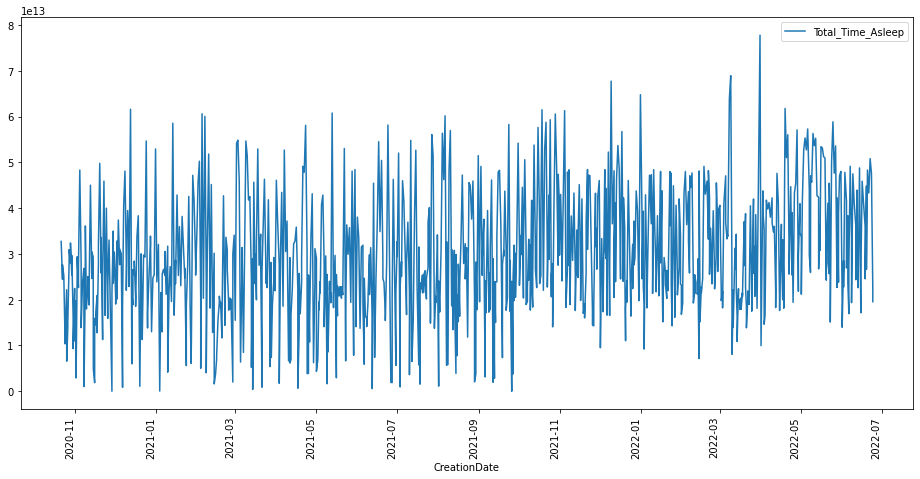

In [270]:
sleep[['Total_Time_Asleep']].plot(label='Total_Time_Asleep', figsize=(16,8))
plt.xticks(rotation=90)
#plt.axhline(y = 7000, color = 'r', linestyle = '-')